# 100,000 UK Used Car Dataset Regression with Supervised Learning

# Bussiness Understanding
## Business and Problem Statement
Saat ini terjadi perang harga di pasar mobil bekas. Sehingga pembeli menjadi lebih selektif dalam memilih mobil yang akan dibeli berdasarkan harga mobil yang telah dipasang. Maka dari itu penjual mobil perlu beradaptasi dengan pasar agar mobil dapat terjual dan tetap mendapatkan keuntungan dari hasil penjualan. Harga mobil yang terlalu tinggi dapat menyebabkan mobil tidak terjual dan untuk jangka panjangnya mobil seringkali kehilangan nilainya seiring berjalannya waktu.

Harga jual mobil dipengaruhi oleh beberapa faktor seperti merek, usia, dan spesifikasi mobil. Merek berpengaruh terhadap harga jual. Hal ini disebabkan oleh track record dari merek yang lebih terjamin kualitasnya. Usia mempengaruhi harga mobil disebabkan mobil karena usia berkaitan dengan frekuensi penggunaan mobil. 

PWDK otomarket adalah perusahaan jual beli mobil yang ada di UK. Saat ini perusahaan hanya mematok harga jual dengan cara menambahkan 5% dari harga beli mobil tersebut. Dengan metode tersebut perusahaan berpotensi menerima kerugian disebabkan harga beli yang terlalu tinggi dibandingkan harga pasaran. Kami sebagai data scientist di PWDK otomarket ditugaskan untuk menentukan harga pasaran dari mobil berdasarkan brand, model, dan spesifikasi dari mobil.

## Data Availability
Data yang dimiliki hanya terbatas mobil yang dijual terlepas dari apakah mobil tersebut telah terjual maupun tidak. Kami akan menggunakan pola dari brand, model, dan spesifikasi mobil dengan harga jualnya untuk memprediksi harga jual mobil. 

## Analytic Approach
Machine Learning dengan tipe Supervised Learning Regression menjadi metode kami untuk memprediksi harga mobil. Data yang sudah dibersihkan akan dibagi menjadi 3 yaitu : Data Train, Data Validation, dan Data Test. Nantinya Data Test akan diambil sebagian sebagai tolak ukur pengaruh model terhadap keuntungan perusahaan. Untuk pelatihan dan validasi akan diiterasi sebanyak 5 kali agar dapat mendapatkan hasil yang konsisten. Evaluasi dilakukan dengan membandingkan R Square antar model. Setelah diketahui model-model terbaik, akan dilakukan hyperparameter tuning dengan menggunakan 2 metode yaitu GridSearch dan RandomSearch agar dapat meraih hasil prediksi yang optimal. <br> <br>
Kekeliruan dalam prediksi dapat menyebabkan dampak seperti berikut : <br>
1. Ketika hasil prediksi yang dilakukan jauh dibawah harga pasar. Maka perusahaan berpotensi untuk kehilangan keuntungan karena sesungguhnya mobil dapat dijual dengan harga yang lebih tinggi.
2. Ketika hasil prediksi yang dilakukan melebihi harga pasar. Maka mobil yang tersebut mempunyai peluang terjual yang sangat sedikit.

# Data Understanding
Kami menggunakan Dataset “100,000 UK Used Car Data set” yang ada di Kaggle. Dataset tersebut berisi data mobil yang dijual yang ada di UK dari tahun 1970 hingga 2020. Dataset tersebut mempunyai 9 variabel termasuk 1 label “price” di dalamnya. Berikut adalah detail dari variabel yang ada :



Dan berikut adalah rincian dari label dataset :

Nama		: price <br>
Tipe Data 	: float <br>
Deskripsi	: Harga mobil satuan.

In [1]:
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import pingouin as pg

import warnings
warnings.filterwarnings('ignore')

# Getting Data

In [2]:
audi = pd.read_csv("audi.csv")
bmw = pd.read_csv("bmw.csv")
cclass = pd.read_csv("cclass.csv")
focus = pd.read_csv("focus.csv")
ford = pd.read_csv("ford.csv")
hyundi = pd.read_csv("hyundi.csv")
merc = pd.read_csv("merc.csv")
skoda = pd.read_csv("skoda.csv")
toyota = pd.read_csv("toyota.csv")
vauxhall = pd.read_csv("vauxhall.csv")
vw = pd.read_csv("vw.csv")

u_cclass = pd.read_csv("unclean cclass.csv")
u_focus = pd.read_csv("unclean focus.csv")

In [3]:
## Menghilangkan Spasi di awal setiap categoric value

cat_cols = list(merc.select_dtypes(include='object').columns)

brand = [audi, bmw, cclass, focus, ford, hyundi, merc, skoda, toyota, vauxhall, vw]

for i in brand :

    i[cat_cols] = i[cat_cols].apply(lambda x: x.str.strip())

In [4]:
## Penggabungan dataframe merc dan cclass karena cclass adalah salah satu model dari merc

full_merc = pd.concat([merc,cclass]).reset_index(drop=True)
full_merc

,model,year,price,transmission,mileage,fuelType,tax,mpg,engineSize
0,SLK,2005,5200,Automatic,63000,Petrol,325.0,32.1,1.8
1,S Class,2017,34948,Automatic,27000,Hybrid,20.0,61.4,2.1
2,SL CLASS,2016,49948,Automatic,6200,Petrol,555.0,28.0,5.5
3,G Class,2016,61948,Automatic,16000,Petrol,325.0,30.4,4.0
4,G Class,2016,73948,Automatic,4000,Petrol,325.0,30.1,4.0
...,...,...,...,...,...,...,...,...,...
17013,C Class,2017,14700,Manual,31357,Diesel,NaN,NaN,1.6
17014,C Class,2018,18500,Automatic,28248,Diesel,NaN,NaN,2.1
17015,C Class,2014,11900,Manual,48055,Diesel,NaN,NaN,2.1
17016,C Class,2014,11300,Automatic,49865,Diesel,NaN,NaN,2.1


In [5]:
## Penggabungan dataframe ford dan focus karena focus adalah salah satu model dari ford

full_ford = pd.concat([ford,focus]).reset_index(drop=True)
full_ford

,model,year,price,transmission,mileage,fuelType,tax,mpg,engineSize
0,Fiesta,2017,12000,Automatic,15944,Petrol,150.0,57.7,1.0
1,Focus,2018,14000,Manual,9083,Petrol,150.0,57.7,1.0
2,Focus,2017,13000,Manual,12456,Petrol,150.0,57.7,1.0
3,Fiesta,2019,17500,Manual,10460,Petrol,145.0,40.3,1.5
4,Fiesta,2019,16500,Automatic,1482,Petrol,145.0,48.7,1.0
...,...,...,...,...,...,...,...,...,...
23414,Focus,2019,18745,Manual,7855,Diesel,NaN,NaN,2.0
23415,Focus,2019,16350,Manual,13891,Petrol,NaN,NaN,1.0
23416,Focus,2019,16850,Manual,13452,Petrol,NaN,NaN,1.0
23417,Focus,2019,17310,Automatic,13376,Petrol,NaN,NaN,1.0


In [6]:
## Menambah kolom brand pada masing-masing dataframe

audi['brand'] = "Audi"
bmw['brand'] = "BMW"
full_ford['brand'] = "Ford"
hyundi['brand'] = "Hyundi"
full_merc['brand'] = "Merc"
skoda['brand'] = "Skoda"
toyota['brand'] = "Toyota"
vauxhall['brand'] = "Vauxhall"
vw['brand'] = "VW"

In [7]:
hyundi.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4860 entries, 0 to 4859
Data columns (total 10 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   model         4860 non-null   object 
 1   year          4860 non-null   int64  
 2   price         4860 non-null   int64  
 3   transmission  4860 non-null   object 
 4   mileage       4860 non-null   int64  
 5   fuelType      4860 non-null   object 
 6   tax(£)        4860 non-null   int64  
 7   mpg           4860 non-null   float64
 8   engineSize    4860 non-null   float64
 9   brand         4860 non-null   object 
dtypes: float64(2), int64(4), object(4)
memory usage: 379.8+ KB


In [8]:
## Mengubah nama kolom tax pada dataframe hyundi
hyundi.rename(columns = {"tax(£)" : "tax"}, inplace = True)
hyundi.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4860 entries, 0 to 4859
Data columns (total 10 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   model         4860 non-null   object 
 1   year          4860 non-null   int64  
 2   price         4860 non-null   int64  
 3   transmission  4860 non-null   object 
 4   mileage       4860 non-null   int64  
 5   fuelType      4860 non-null   object 
 6   tax           4860 non-null   int64  
 7   mpg           4860 non-null   float64
 8   engineSize    4860 non-null   float64
 9   brand         4860 non-null   object 
dtypes: float64(2), int64(4), object(4)
memory usage: 379.8+ KB


In [9]:
df = pd.concat([audi, bmw, full_ford, hyundi, full_merc, skoda, toyota, vauxhall, vw], ignore_index=True)
df

,model,year,price,transmission,mileage,fuelType,tax,mpg,engineSize,brand
0,A1,2017,12500,Manual,15735,Petrol,150.0,55.4,1.4,Audi
1,A6,2016,16500,Automatic,36203,Diesel,20.0,64.2,2.0,Audi
2,A1,2016,11000,Manual,29946,Petrol,30.0,55.4,1.4,Audi
3,A4,2017,16800,Automatic,25952,Diesel,145.0,67.3,2.0,Audi
4,A3,2019,17300,Manual,1998,Petrol,145.0,49.6,1.0,Audi
...,...,...,...,...,...,...,...,...,...,...
108535,Eos,2012,5990,Manual,74000,Diesel,125.0,58.9,2.0,VW
108536,Fox,2008,1799,Manual,88102,Petrol,145.0,46.3,1.2,VW
108537,Fox,2009,1590,Manual,70000,Petrol,200.0,42.0,1.4,VW
108538,Fox,2006,1250,Manual,82704,Petrol,150.0,46.3,1.2,VW


Tabel di atas merupakan hasil dari penggabungan dataframe antar brand.

# EDA

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 108540 entries, 0 to 108539
Data columns (total 10 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   model         108540 non-null  object 
 1   year          108540 non-null  int64  
 2   price         108540 non-null  int64  
 3   transmission  108540 non-null  object 
 4   mileage       108540 non-null  int64  
 5   fuelType      108540 non-null  object 
 6   tax           99187 non-null   float64
 7   mpg           99187 non-null   float64
 8   engineSize    108540 non-null  float64
 9   brand         108540 non-null  object 
dtypes: float64(3), int64(3), object(4)
memory usage: 8.3+ MB


Missing Value hanya terdapat di kolom tax dan mpg.

In [11]:
df.describe()

,year,price,mileage,tax,mpg,engineSize
count,108540.000000,108540.000000,108540.000000,99187.000000,99187.000000,108540.000000
mean,2017.098028,16890.124046,23025.928469,120.299838,55.166825,1.661644
std,2.130057,9756.266820,21176.423684,63.150926,16.138522,0.557058
min,1970.000000,450.000000,1.000000,0.000000,0.300000,0.000000
25%,2016.000000,10229.500000,7491.750000,125.000000,47.100000,1.200000
50%,2017.000000,14698.000000,17265.000000,145.000000,54.300000,1.600000
75%,2019.000000,20940.000000,32236.000000,145.000000,62.800000,2.000000
max,2060.000000,159999.000000,323000.000000,580.000000,470.800000,6.600000


1. Untuk variable year, perlu diperhatikan bahwa terdapat tahun 2060 yang merupakan anomali dan memiliki nilai minimal di tahun 1970. <br>
2. Untuk variable mileage, terdapat angka minimal 1 yang berarti mobil yang dijual merupakan mobil yang baru dibeli atau hampir tidak digunakan. <br>
3. Untuk variable mpg, terdapat nilai minimal 0.3 yang merupakan data anomali. <br>

## Histogram variable numeric

In [12]:
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.figure_factory as ff

In [13]:
fig = make_subplots(
    rows=2, cols=2, 
    start_cell="top-left",
    subplot_titles=("price", "mileage", "mpg"))

fig.add_trace(
    go.Histogram(x=df['price'], name="price"),     
    row=1, col=1)

fig.add_trace(
    go.Histogram(x=df['mileage'], name="mileage"),
    row=1, col=2)

fig.add_trace(
    go.Histogram(x=df['mpg'], name="mpg"),
    row=2, col=1)

fig.update_xaxes(range=[0, 60000], row=1, col=1)
fig.update_xaxes(range=[0, 100000], row=1, col=2)
fig.update_xaxes(range=[0, 200], row=2, col=1)

fig.update_layout(
    autosize=False,
    width=1500,
    height=800,
    title = "Histogram Variable Numeric")

fig.show()

1. Terlihat dari grafik berikut, bahwa distribusi kolom price, mileage, dan mpg berbentuk right-skewed. <br>
2. Untuk variable milage, terdapat nilai dominan mendekati 0 yang berarti mobil tersebut termasuk baru atau hampir tidak pernah digunakan. <br>

Untuk variable tax dan engineSize, digunakan barplot karena kedua variable tersebut mempunyai ketentuan tersendiri sehingga bukan merupakan data continous.

In [14]:
tax = df['tax'].nunique()
engineSize = df['engineSize'].nunique()

print(f"Variable tax mempunyai nilai unik sebanyak {tax}")
print(f"Sedangkan variable engineSize mempunyai nilai unik sebanyak {engineSize}")

Variable tax mempunyai nilai unik sebanyak 48
Sedangkan variable engineSize mempunyai nilai unik sebanyak 42


In [15]:
n_tax = df['tax'].value_counts().head(10)
n_engineSize = df['engineSize'].value_counts().head(10)

layout = go.Layout(xaxis=dict(type='category'))

fig = make_subplots(
    rows=2, cols=1, 
    start_cell="top-left",
    subplot_titles=("tax", "engineSize"))

fig.add_trace(
    go.Bar(
        y=n_tax.values, 
        x=n_tax.index, 
        name="tax",
        text=n_tax.values,
        textposition='auto'),    
    row=1, col=1)

fig.add_trace(
    go.Bar(
        y=n_engineSize.values, 
        x=n_engineSize.index, 
        name="engineSize",
        text=n_engineSize.values,
        textposition='auto'),
    row=2, col=1)

fig.update_layout(
    autosize=False,
    width=1600,
    height=1200,
    title="Persebaran Tipe tax dan engineSize (Top 10)")

fig.update_xaxes(type = "category")

fig.show()

1. Untuk variable tax, nilai pajak terbanyak ada pada angka 145 pounds. <br>
2. Sedangkan untuk variable engineSize, varian terbanyak adalah mobil dengan ukuran mesin 2 L lalu disusul dengan varian 1 L.

## Box Plot variable numeric

In [16]:
fig = make_subplots(
    rows=2, cols=3, 
    start_cell="top-left",
    subplot_titles=("price", "mileage", "tax", "mpg", "engineSize"))

fig.add_trace(
    go.Box(y=df['price'], name="price"),    
    row=1, col=1)

fig.add_trace(
    go.Box(y=df['mileage'], name="mileage"),
    row=1, col=2)

fig.add_trace(
    go.Box(y=df['tax'], name="tax"),
    row=1, col=3)

fig.add_trace(
    go.Box(y=df['mpg'], name="mpg"),
    row=2, col=1)

fig.add_trace(
    go.Box(y=df['engineSize'], name="engineSize"),
    row=2, col=2)

fig.update_layout(
    autosize=False,
    width=1600,
    height=1000,
    title = "Boxplot untuk Variable Numeric")

fig.show()



In [17]:
corr = df.corr(method = "spearman")
corr

,year,price,mileage,tax,mpg,engineSize
year,1.000000,0.606435,-0.813931,0.329870,-0.327676,-0.040957
price,0.606435,1.000000,-0.523746,0.317650,-0.393450,0.573606
mileage,-0.813931,-0.523746,1.000000,-0.263119,0.336604,0.102945
tax,0.329870,0.317650,-0.263119,1.000000,-0.576143,0.165301
mpg,-0.327676,-0.393450,0.336604,-0.576143,1.000000,-0.206707
engineSize,-0.040957,0.573606,0.102945,0.165301,-0.206707,1.000000


<AxesSubplot:title={'center':'Korelasi Antar Variable Numerik'}>

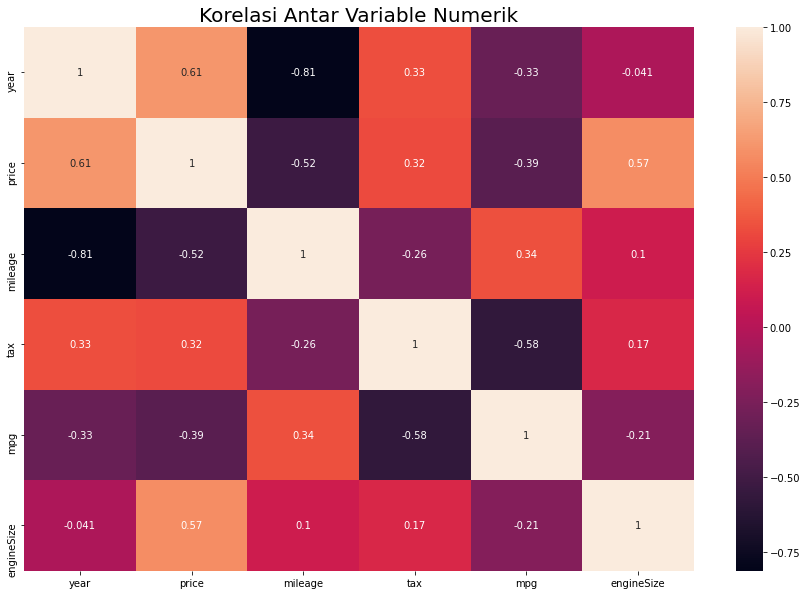

In [18]:
plt.figure (figsize=(15,10))
plt.title("Korelasi Antar Variable Numerik", size = 20)
sns.heatmap(corr, annot=True)

1. Terdapat korelasi yang cukup signifikan (dalam bentuk negatif) antara variable mileage dan juga variable year. Yang mana berarti jarak tempuh yang semakin jauh apabila tahun rilis mobil semakin kecil. <br>
2. Ada 2 variable yang berpengaruh terhadap variable price yaitu variable year dan juga variable engineSize. Kedua variable tersebut mempunyai korelasi positif terhadap variable price.

## Barplot untuk variabel kategorik

In [19]:
n_transmission = df['transmission'].value_counts(ascending = False)
n_fuelType = df['fuelType'].value_counts(ascending = False)
n_year = df['year'].value_counts()

fig = make_subplots(
    rows=3, cols=1, 
    start_cell="top-left",
    subplot_titles=("transmission", "fuelType", "year"))

fig.add_trace(
    go.Bar(
        y=n_transmission.values, 
        x=n_transmission.index, 
        name="transmission",
        text=n_transmission.values,
        textposition='auto'),    
    row=1, col=1)

fig.add_trace(
    go.Bar(
        y=n_fuelType.values, 
        x=n_fuelType.index, 
        name="fuelType",
        text=n_fuelType.values,
        textposition='auto'),   
    row=2, col=1)

fig.add_trace(
    go.Bar(
        y=n_year.values, 
        x=n_year.index, 
        name="year",
        text=n_year.values,
        textposition='auto'),    
    row=3, col=1)

fig.update_layout(
    autosize=False,
    width=1600,
    height=1200,
    title = "Persebaran untuk Variable Kategorik")

fig.update_xaxes(range=[1999, 2021], row=3, col=1)

fig.show()

1. Transmisi manual masih menjadi unit mobil yang dijual paling banyak. Dibawahnya ada dua tipe transmisi yang memiliki jumlah unit yang tidak begitu jauh yaitu semi-auto dan juga automatic. <br>
2. Untuk variable fuelType, Petrol dan Diesel menjadi jenis bahan bakar terbanyak jauh meninggalkan hybrid dan electric.
3. Pada setiap tahun rilis, jumlah mobil yang dijual mengalami peningkatan, namun pengecualian untuk tahun 2018 dan 2020 yang mengalami penurunan dari tahun sebelumnya.

# Cleaning

## Cleaning duplicate pada merc dan cclass

In [20]:
## Dapatkan ID dari yg duplicate khusus model C Class tanpa tax dan mpg

duplicated_idx_cclass = df[df['model']=='C Class'].index[df[df['model']=='C Class'].duplicated(list(cclass.columns))]
len(duplicated_idx_cclass)

3701

In [21]:
## Drop data dengan ID tersebut

df = df.drop(duplicated_idx_cclass,0)
df

,model,year,price,transmission,mileage,fuelType,tax,mpg,engineSize,brand
0,A1,2017,12500,Manual,15735,Petrol,150.0,55.4,1.4,Audi
1,A6,2016,16500,Automatic,36203,Diesel,20.0,64.2,2.0,Audi
2,A1,2016,11000,Manual,29946,Petrol,30.0,55.4,1.4,Audi
3,A4,2017,16800,Automatic,25952,Diesel,145.0,67.3,2.0,Audi
4,A3,2019,17300,Manual,1998,Petrol,145.0,49.6,1.0,Audi
...,...,...,...,...,...,...,...,...,...,...
108535,Eos,2012,5990,Manual,74000,Diesel,125.0,58.9,2.0,VW
108536,Fox,2008,1799,Manual,88102,Petrol,145.0,46.3,1.2,VW
108537,Fox,2009,1590,Manual,70000,Petrol,200.0,42.0,1.4,VW
108538,Fox,2006,1250,Manual,82704,Petrol,150.0,46.3,1.2,VW


## Cleaning duplicate pada ford dan focus

In [22]:
## Dapatkan ID dari yg duplicate khusus model Focus tanpa tax dan mpg

duplicated_idx_focus = df[df['model']=='Focus'].index[df[df['model']=='Focus'].duplicated(list(focus.columns))]
len(duplicated_idx_focus)

5060

In [23]:
## Drop data dengan ID tersebut

df = df.drop(duplicated_idx_focus,0)
df

,model,year,price,transmission,mileage,fuelType,tax,mpg,engineSize,brand
0,A1,2017,12500,Manual,15735,Petrol,150.0,55.4,1.4,Audi
1,A6,2016,16500,Automatic,36203,Diesel,20.0,64.2,2.0,Audi
2,A1,2016,11000,Manual,29946,Petrol,30.0,55.4,1.4,Audi
3,A4,2017,16800,Automatic,25952,Diesel,145.0,67.3,2.0,Audi
4,A3,2019,17300,Manual,1998,Petrol,145.0,49.6,1.0,Audi
...,...,...,...,...,...,...,...,...,...,...
108535,Eos,2012,5990,Manual,74000,Diesel,125.0,58.9,2.0,VW
108536,Fox,2008,1799,Manual,88102,Petrol,145.0,46.3,1.2,VW
108537,Fox,2009,1590,Manual,70000,Petrol,200.0,42.0,1.4,VW
108538,Fox,2006,1250,Manual,82704,Petrol,150.0,46.3,1.2,VW


## Remove Dupplicate model lain

In [24]:
## Remove Duplicate Semua Kolom

df.drop_duplicates(inplace = True)
df.reset_index(inplace = True, drop=True)
df

,model,year,price,transmission,mileage,fuelType,tax,mpg,engineSize,brand
0,A1,2017,12500,Manual,15735,Petrol,150.0,55.4,1.4,Audi
1,A6,2016,16500,Automatic,36203,Diesel,20.0,64.2,2.0,Audi
2,A1,2016,11000,Manual,29946,Petrol,30.0,55.4,1.4,Audi
3,A4,2017,16800,Automatic,25952,Diesel,145.0,67.3,2.0,Audi
4,A3,2019,17300,Manual,1998,Petrol,145.0,49.6,1.0,Audi
...,...,...,...,...,...,...,...,...,...,...
98385,Eos,2012,5990,Manual,74000,Diesel,125.0,58.9,2.0,VW
98386,Fox,2008,1799,Manual,88102,Petrol,145.0,46.3,1.2,VW
98387,Fox,2009,1590,Manual,70000,Petrol,200.0,42.0,1.4,VW
98388,Fox,2006,1250,Manual,82704,Petrol,150.0,46.3,1.2,VW


# Menghilangkan Data Anomali pada kolom year

In [25]:
df['year'].value_counts().sort_index()

1970        2
1991        1
1995        1
1996        2
1997        4
1998        9
1999        6
2000        9
2001       20
2002       34
2003       36
2004       53
2005       75
2006       87
2007      169
2008      211
2009      285
2010      344
2011      442
2012      642
2013     2608
2014     4077
2015     7631
2016    15789
2017    21743
2018    13637
2019    26407
2020     4065
2060        1
Name: year, dtype: int64

In [26]:
df[(df['year'] <= 1995) | (df['year'] > 2020)]

,model,year,price,transmission,mileage,fuelType,tax,mpg,engineSize,brand
38794,Fiesta,2060,6495,Automatic,54807,Petrol,205.0,42.8,1.4,Ford
56043,M Class,1970,24999,Automatic,14000,Diesel,305.0,39.2,0.0,Merc
57274,C Class,1991,4450,Automatic,170000,Petrol,NaN,NaN,3.0,Merc
57282,C Class,1995,4750,Automatic,173000,Petrol,NaN,NaN,3.6,Merc
80734,Zafira,1970,10495,Manual,37357,Petrol,200.0,42.2,1.4,Vauxhall


Anomali terdapat pada id :
1. 38794 dikarenakan tidak mungkin mobil buatan tahun 2060 ada pada list.
2. 56043 dikarenakan merc M Class mulai rilis tahun 1997
3. 57274 dikarenakan merc C Class mulai rilis tahun 1993
4. 90588 Vauxhall Zafira mulai rilis pada tahun 1999

Dilakukan drop data pada ID tersebut karena sulit untuk mengisi tahun yang benar berdasarkan variabel lain yang tersedia.

In [27]:
## Mulai drop data anomali pada variabel year dengan ketentuan yang sudah disebutkan

df.drop(index=df[df['year'] > 2021].index, inplace=True)
df.drop(index=df[(df['year'] < 1997) & (df['model'] == 'M Class')].index, inplace=True)
df.drop(index=df[(df['year'] < 1993) & (df['model'] == 'C Class')].index, inplace=True)
df.drop(index=df[(df['year'] < 1999) & (df['model'] == 'Zafira')].index, inplace=True)
df.reset_index(drop=True, inplace=True)
df

,model,year,price,transmission,mileage,fuelType,tax,mpg,engineSize,brand
0,A1,2017,12500,Manual,15735,Petrol,150.0,55.4,1.4,Audi
1,A6,2016,16500,Automatic,36203,Diesel,20.0,64.2,2.0,Audi
2,A1,2016,11000,Manual,29946,Petrol,30.0,55.4,1.4,Audi
3,A4,2017,16800,Automatic,25952,Diesel,145.0,67.3,2.0,Audi
4,A3,2019,17300,Manual,1998,Petrol,145.0,49.6,1.0,Audi
...,...,...,...,...,...,...,...,...,...,...
98381,Eos,2012,5990,Manual,74000,Diesel,125.0,58.9,2.0,VW
98382,Fox,2008,1799,Manual,88102,Petrol,145.0,46.3,1.2,VW
98383,Fox,2009,1590,Manual,70000,Petrol,200.0,42.0,1.4,VW
98384,Fox,2006,1250,Manual,82704,Petrol,150.0,46.3,1.2,VW


# Menghilangkan data anomali pada kolom engineSize

In [28]:
#Mengecek engineSize yang bernilai 0

df[df['engineSize'] == 0]

,model,year,price,transmission,mileage,fuelType,tax,mpg,engineSize,brand
7425,Q5,2019,44790,Automatic,5886,Petrol,135.0,117.7,0.0,Audi
7426,Q3,2019,32788,Automatic,1500,Diesel,145.0,47.1,0.0,Audi
7436,Q3,2020,29944,Manual,1500,Petrol,145.0,40.9,0.0,Audi
7437,Q3,2020,33333,Automatic,1500,Diesel,145.0,47.1,0.0,Audi
7438,Q3,2020,29944,Automatic,1500,Petrol,145.0,32.5,0.0,Audi
...,...,...,...,...,...,...,...,...,...,...
94950,Tiguan,2016,15300,Manual,38398,Diesel,145.0,53.3,0.0,VW
94957,Tiguan,2018,24000,Automatic,22200,Diesel,145.0,47.9,0.0,VW
96083,Up,2017,8500,Manual,20324,Petrol,20.0,64.2,0.0,VW
96141,Up,2017,8000,Manual,24444,Petrol,20.0,60.1,0.0,VW


Terdapat 270 data dengan engineSize 0
Untuk fuelType Electric dan Hybrid, angka tersebut wajar.
Maka dilakukan perubahan value untuk mobil yang memiliki fuelType BUKAN Electric dan Hybrid.
Value diubah menjadi median dari grup model, transmission, dan fuelType mobil terkait.

In [29]:
#Mengecek engineSize yang bernilai 0 dan fuelTypenya bukan merupakan Electric maupun Hybrid

df[(df['engineSize'] == 0) & (~df['fuelType'].isin(['Electric','Hybrid']))]

,model,year,price,transmission,mileage,fuelType,tax,mpg,engineSize,brand
7425,Q5,2019,44790,Automatic,5886,Petrol,135.0,117.7,0.0,Audi
7426,Q3,2019,32788,Automatic,1500,Diesel,145.0,47.1,0.0,Audi
7436,Q3,2020,29944,Manual,1500,Petrol,145.0,40.9,0.0,Audi
7437,Q3,2020,33333,Automatic,1500,Diesel,145.0,47.1,0.0,Audi
7438,Q3,2020,29944,Automatic,1500,Petrol,145.0,32.5,0.0,Audi
...,...,...,...,...,...,...,...,...,...,...
94950,Tiguan,2016,15300,Manual,38398,Diesel,145.0,53.3,0.0,VW
94957,Tiguan,2018,24000,Automatic,22200,Diesel,145.0,47.9,0.0,VW
96083,Up,2017,8500,Manual,20324,Petrol,20.0,64.2,0.0,VW
96141,Up,2017,8000,Manual,24444,Petrol,20.0,60.1,0.0,VW


Terdapat 230 data anomali untuk kolom engineSize

In [30]:
## Dapatkan median dikelompokkan dari model, transmission, dan fuelType
engine_median = df.groupby(['model', 'transmission', 'fuelType']).median()['engineSize'].reset_index()

#Fungsi untuk menggganti data engineSize jika engineSize memiliki nilai 0 dan fuelTypenya bukan Electric maupun Hybrid
def change_engineSize(cols):
    if (cols['engineSize'] == 0) & ((cols['fuelType'] != "Electric") | (cols['fuelType'] != "Hybrid")) :
        return float(engine_median[(engine_median['model'] == cols['model']) & (engine_median['transmission'] == cols['transmission']) & (engine_median['fuelType'] == cols['fuelType'])]['engineSize'])
    else:
        return cols['engineSize']
        
engine_median

,model,transmission,fuelType,engineSize
0,1 Series,Automatic,Diesel,2.0
1,1 Series,Automatic,Petrol,2.0
2,1 Series,Manual,Diesel,2.0
3,1 Series,Manual,Petrol,1.5
4,1 Series,Semi-Auto,Diesel,2.0
...,...,...,...,...
814,i3,Automatic,Electric,0.0
815,i3,Automatic,Hybrid,0.0
816,i3,Automatic,Other,0.6
817,i8,Automatic,Hybrid,1.5


In [31]:
## Implementasikan fungsi change_engineSize pada setiap row df

df['engineSize'] = df[['engineSize','model','transmission','fuelType']].apply(change_engineSize, axis = 1)

In [32]:
#Mengecek engineSize yang bernilai 0 dan fuelTypenya bukan merupakan Electric maupun Hybrid

df[(df['engineSize'] == 0) & (~df['fuelType'].isin(['Electric','Hybrid']))]

,model,year,price,transmission,mileage,fuelType,tax,mpg,engineSize,brand
53634,GLA Class,2016,18700,Other,30895,Other,125.0,56.5,0.0,Merc
55318,230,2007,4500,Automatic,94000,Petrol,520.0,29.4,0.0,Merc


Masih terdapat 2 data anomali yang akan diisi secara manual. Setelah mencari referensi, didapatkan data sebagai berikut :

1. Merc GLA Class tahun 2016 memiliki engineSize 2.0
2. Merc 230 tahun 2007 transmisi Automatic dan fuelType Petrol memiliki engineSize 2.5


In [33]:
## Ganti value engineSize dari sisa 2 data anomali tersebut secara manual

df.loc[53634, 'engineSize'] = 2.0
df.loc[55318, 'engineSize'] = 2.5


In [34]:
#Mengecek engineSize yang bernilai 0 dan fuelTypenya bukan merupakan Electric maupun Hybrid

df[(df['engineSize'] == 0) & (~df['fuelType'].isin(['Electric','Hybrid']))]

,model,year,price,transmission,mileage,fuelType,tax,mpg,engineSize,brand


<AxesSubplot:title={'center':'Korelasi Antar Variable Numerik'}>

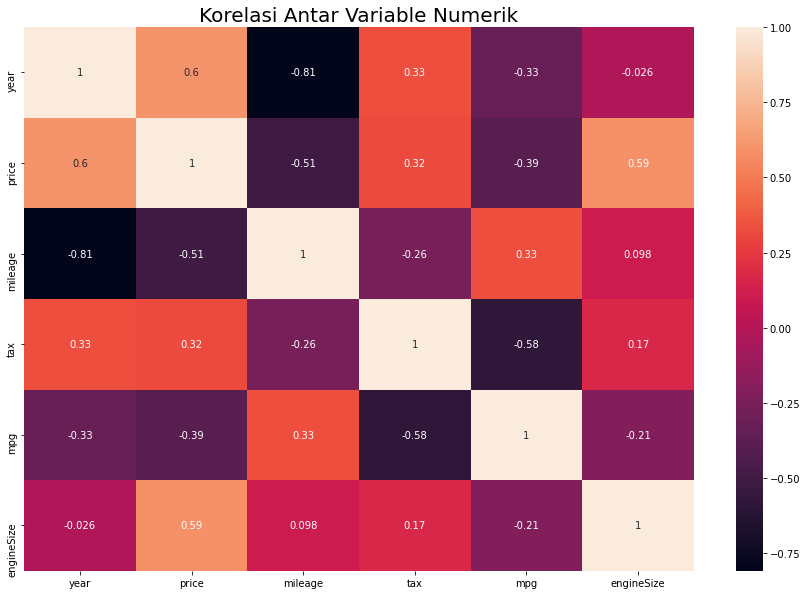

In [35]:
corr = df.corr(method = "spearman")

plt.figure (figsize=(15,10))
plt.title("Korelasi Antar Variable Numerik", size = 20)
sns.heatmap(corr, annot=True)

Proses cleaning pada kolom engineSize berpengaruh terhadap korelasi engineSize dan price yang mengalami peningkatan dari 0.57 ke 0.59

# Cleaning Data anomali MPG

In [36]:
df[df['mpg'] < 1]

,model,year,price,transmission,mileage,fuelType,tax,mpg,engineSize,brand
97734,Golf SV,2019,17950,Manual,100,Petrol,145.0,0.3,1.0,VW


Dilakukan drop pada data tersebut karena memiliki mpg yang tidak realistis.

In [37]:
## Mulai drop data anomali pada variabel mpg

df.drop(index=df[df['mpg'] < 1].index, inplace=True)
df.reset_index(drop=True, inplace=True)
df

,model,year,price,transmission,mileage,fuelType,tax,mpg,engineSize,brand
0,A1,2017,12500,Manual,15735,Petrol,150.0,55.4,1.4,Audi
1,A6,2016,16500,Automatic,36203,Diesel,20.0,64.2,2.0,Audi
2,A1,2016,11000,Manual,29946,Petrol,30.0,55.4,1.4,Audi
3,A4,2017,16800,Automatic,25952,Diesel,145.0,67.3,2.0,Audi
4,A3,2019,17300,Manual,1998,Petrol,145.0,49.6,1.0,Audi
...,...,...,...,...,...,...,...,...,...,...
98380,Eos,2012,5990,Manual,74000,Diesel,125.0,58.9,2.0,VW
98381,Fox,2008,1799,Manual,88102,Petrol,145.0,46.3,1.2,VW
98382,Fox,2009,1590,Manual,70000,Petrol,200.0,42.0,1.4,VW
98383,Fox,2006,1250,Manual,82704,Petrol,150.0,46.3,1.2,VW


In [38]:
df.isna().sum()

model             0
year              0
price             0
transmission      0
mileage           0
fuelType          0
tax             697
mpg             697
engineSize        0
brand             0
dtype: int64

In [39]:
df[~df['model'].isin(['C Class', 'Focus'])].isna().sum()

model           0
year            0
price           0
transmission    0
mileage         0
fuelType        0
tax             0
mpg             0
engineSize      0
brand           0
dtype: int64

Missing Value hanya ada di model C Class dan Focus

# Missing Value

## Missing Value pada kolom tax

In [40]:
df.anova(dv='tax',between='model', detailed=True)

,Source,SS,DF,MS,F,p-unc,np2
0,model,8.007380e+07,194,412751.568826,128.952457,0.0,0.204202
1,Within,3.120560e+08,97493,3200.804215,NaN,NaN,NaN


karena terdapat perbedaan perbedaan mean tax antara model maka :

In [41]:
import statsmodels.api as sm
from statsmodels.formula.api import ols
from scipy import stats

In [42]:
model = ols('tax ~ model', data=df).fit()
anova_table = sm.stats.anova_lm(model, typ=2)
anova_table

,sum_sq,df,F,PR(>F)
model,8.007380e+07,194.0,128.952457,0.0
Residual,3.120560e+08,97493.0,NaN,NaN


In [43]:
w, pvalue = stats.normaltest(model.resid)
print(w, pvalue)

6493.565641226542 0.0


Dikarenakan resid nya berdistribusi normal, maka anova dapat dipakai. Dan terbukti bahwa model mempengaruhi jumlah tax mobil.

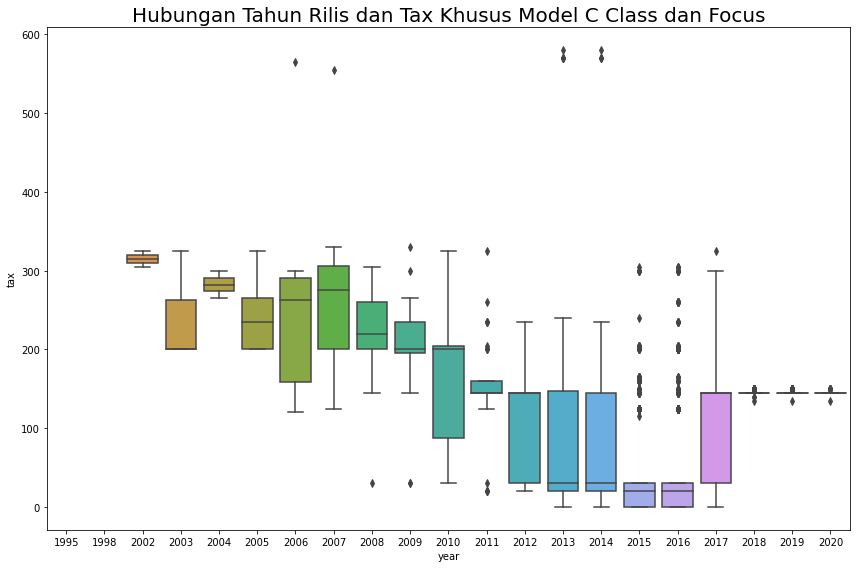

In [44]:
## Hubungan year dan tax khusus model C Class dan Focus

plt.figure(figsize=(12,8))
sns.boxplot(x='year',y='tax', data=df[df['model'].isin(['C Class','Focus'])])
plt.title("Hubungan Tahun Rilis dan Tax Khusus Model C Class dan Focus", size = 20)
plt.tight_layout()

1. Untuk tahun 2018-2020 data tax cenderung seragam dengan outlier yang tidak terlalu melenceng.
2. Untuk tahun 2013-2017 tax juga cenderung seragam dengan beberapa outlier.
3. Untuk sebelum tahun 2013, tax cenderung meningkat seiring dengan semakin lama tahun rilis mobilnya.
4. Tahun 2005 ke bawah memiliki nilai tax yang cenderung stabil dan tidak mengalami trend peningkatan kembali. 

## Mengisi Missing Value pada Kolom MPG

In [45]:
model_mpg = ols('mpg ~ model', data=df).fit()
anova_table = sm.stats.anova_lm(model_mpg, typ=2)
anova_table

,sum_sq,df,F,PR(>F)
model,1.225322e+07,194.0,462.089143,0.0
Residual,1.332589e+07,97493.0,NaN,NaN


Terdapat pengaruh mpg dengan model terkait.

In [46]:
w, pvalue = stats.normaltest(model_mpg.resid)
print(w, pvalue)

75538.59287658441 0.0


Resid berdistribusi normal sehingga anova dapat dipakai. Dan terbukti bahwa model cukup mempunyai pengaruh ke banyak mpg suatu mobil pada class Focus dan C Class.

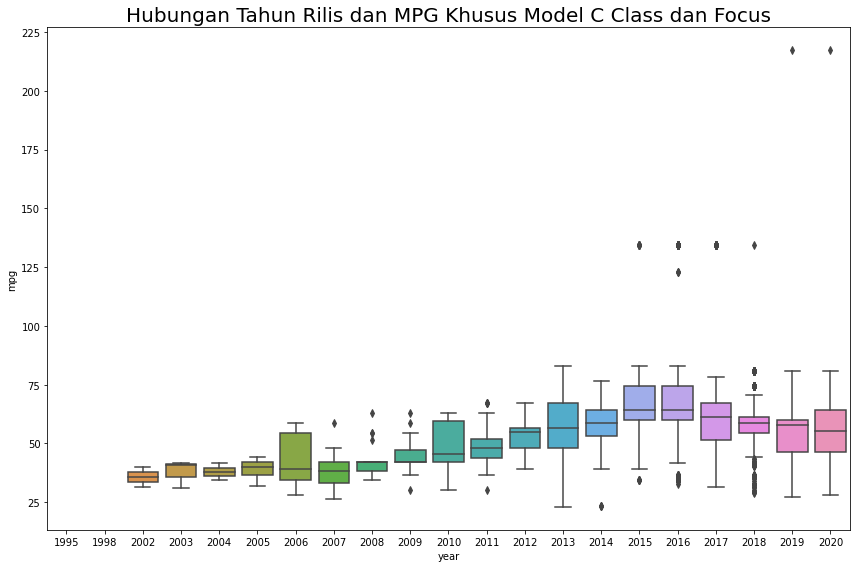

In [47]:
## Grafik hubungan tahun rilis dengan mpg focus dan C Class

plt.figure(figsize=(12,8))
sns.boxplot(x='year',y='mpg', data=df[df['model'].isin(['C Class','Focus'])])
plt.title("Hubungan Tahun Rilis dan MPG Khusus Model C Class dan Focus", size = 20)
plt.tight_layout()

Terlihat dari boxplot diatas bahwa tahun rilis tidak mempunyai pengaruh signifikan ke mpg.

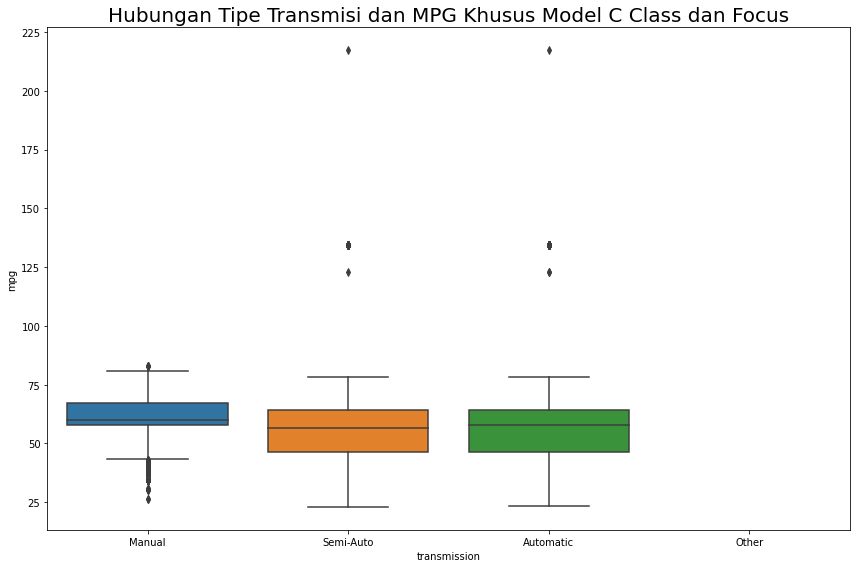

In [48]:
## Grafik hubungan transmission dengan MPG mobil Focus dan C Class

plt.figure(figsize=(12,8))
sns.boxplot(x='transmission',y='mpg', data=df[df['model'].isin(['C Class','Focus'])])
plt.title("Hubungan Tipe Transmisi dan MPG Khusus Model C Class dan Focus", size = 20)
plt.tight_layout()

Terlihat dari boxplot di atas bahwa transmisi tidak mempunyai pengaruh yang signifikan ke mpg mobil C Class dan Focus.

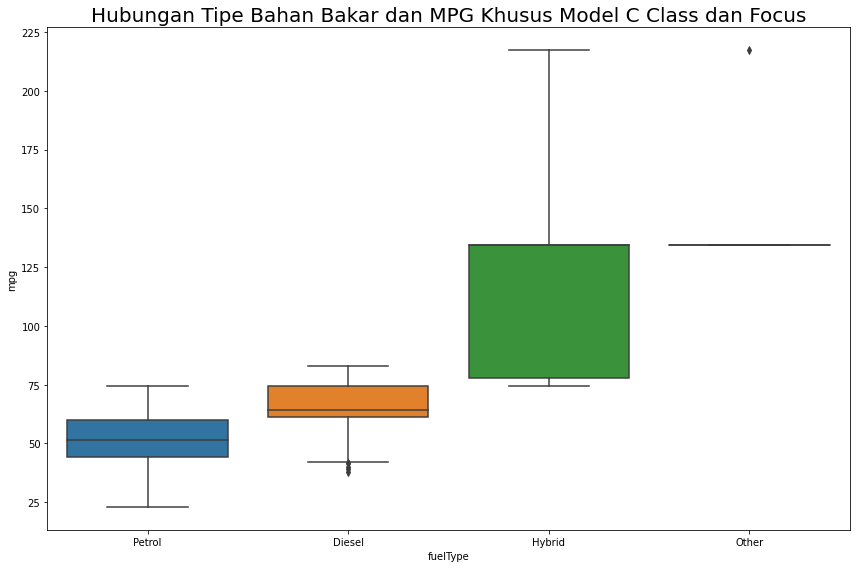

In [49]:
## Grafik hubungan fuelType dengan MPG mobil C Class dan Focus

plt.figure(figsize=(12,8))
sns.boxplot(x='fuelType',y='mpg', data=df[df['model'].isin(['C Class','Focus'])])
plt.title("Hubungan Tipe Bahan Bakar dan MPG Khusus Model C Class dan Focus", size = 20)
plt.tight_layout()

Terlihat dari grafik di atas bahwa untuk mobil Focus dan C Class mempunyai mpg yang cenderung besar untuk tipe bahan bakar Hybrid, lalu disusul Diesel, dan yang terendah adalah jenis bahan bakar petrol.

In [50]:
## Define Class uintuk mengganti missing value tax dengan nilai median tax dari grup model dan tahun rilis mobil.
## Define Class uintuk mengganti missing value mpg dengan nilai median mpg dari grup model dan fuelType mobil.

from sklearn.base import BaseEstimator, TransformerMixin
class CustomImputer1(BaseEstimator, TransformerMixin):
    def __init__(self):
        super().__init__()
        self.tax_med = {}
        self.mpg_med = {}

    def fit(self, X, y=None):
        self.tax_med = X.groupby(['model', 'year']).tax.median()
        self.mpg_med = X.groupby(['model','fuelType']).mpg.median()

        return self

    def transform(self, X, y=None):
        # fill tax
        for key, value in self.tax_med.items():
            X.loc[((np.isnan(X["tax"])) & (X.model == key[0]) & (X.year == key[1])), 'tax'] = value
        # fill mpg
        for key, val in self.mpg_med.items():
            X.loc[((np.isnan(X['mpg'])) & (X.model == key[0]) & (X.fuelType == key[1])), 'mpg'] = val

        return X

In [51]:
print('--> Before applying transform')
print('Nan count:', df.isna().sum())
print('mpg mean:', df['mpg'].mean())
print('tax mean:', df['tax'].mean(), '\n')

# Instantiating Instantiating
my_CustomImputer = CustomImputer1()

--> Before applying transform
Nan count: model             0
year              0
price             0
transmission      0
mileage           0
fuelType          0
tax             697
mpg             697
engineSize        0
brand             0
dtype: int64
mpg mean: 55.206456473671274
tax mean: 120.13154123331422 



In [52]:
# Fitting operation
my_CustomImputer.fit(df)

print('Learned parameters')
print(my_CustomImputer.tax_med)
print(my_CustomImputer.mpg_med)

# Applying the CustomImputer
my_CustomImputer.transform(df)

print('\n--> After applying transform')
print('Nan count:', df.isna().sum())
print('mpg mean:', df['mpg'].mean())
print('tax mean:', df['tax'].mean())

Learned parameters
model     year
1 Series  2001    125.0
          2004    200.0
          2005    265.0
          2006    230.0
          2007    125.0
                  ...  
i8        2015      0.0
          2016      0.0
          2017      0.0
          2018    135.0
          2019    135.0
Name: tax, Length: 1611, dtype: float64
model     fuelType
1 Series  Diesel       67.3
          Petrol       44.1
180       Diesel       72.4
2 Series  Diesel       62.8
          Hybrid      141.2
                      ...  
i3        Electric    470.8
          Hybrid      470.8
          Other       470.8
i8        Hybrid      134.5
          Other       134.5
Name: mpg, Length: 382, dtype: float64

--> After applying transform
Nan count: model           0
year            0
price           0
transmission    0
mileage         0
fuelType        0
tax             4
mpg             0
engineSize      0
brand           0
dtype: int64
mpg mean: 55.27585221324388
tax mean: 120.15813520903427


Masih tersisa 4 null value pada kolom tax karena median tahun tersebut untuk model yang sama adalah 0.

In [53]:
df[df.isna().any(axis=1)]

,model,year,price,transmission,mileage,fuelType,tax,mpg,engineSize,brand
39458,Focus,2002,795,Manual,101000,Petrol,NaN,58.9,1.6,Ford
57279,C Class,1995,4750,Automatic,173000,Petrol,NaN,45.6,3.6,Merc
57295,C Class,2003,1795,Automatic,88082,Diesel,NaN,61.4,2.1,Merc
57312,C Class,1998,1290,Automatic,140000,Petrol,NaN,45.6,2.0,Merc


Tabel di atas adalah data tax yang masih kosong. Dan berikut adalah hasil pengecekan manual data setelah digrouping menurut model dan year. (Hanya fokus pada group yang masih null.)

In [54]:
year_group = df[["model", "year", "tax"]].groupby(["model","year"]).median().reset_index()

print("Berikut adalah median kolom tax untuk mobil model Focus tahun 2002 : ")
print(year_group[(year_group["model"] == "Focus") & (year_group["year"] == 2002)])

print("Berikut adalah median kolom tax untuk mobil model Focus tahun 1995,1998, dan 2003 : ")
print(year_group[(year_group["model"] == "C Class") & (year_group["year"].isin([1995, 1998, 2003]))])

Berikut adalah median kolom tax untuk mobil model Focus tahun 2002 : 
     model  year  tax
587  Focus  2002  NaN
Berikut adalah median kolom tax untuk mobil model Focus tahun 1995,1998, dan 2003 : 
       model  year  tax
355  C Class  1995  NaN
356  C Class  1998  NaN
358  C Class  2003  NaN


Terlihat bahwa nilai median masih NaN dikarenakan hanya ada 1 row (null value) pada setiap group. Sehingga perlu digunakan solusi lain. <br> <br>
Sesuai dengan insight dari perbandingan kolom year terhadap tax pada penjelasan sebelumnya, untuk tahun sebelum 2005 nilai tax cenderung lebih stabil dan tidak lagi mengalami peningkatan. <br>
Sehingga grouping median dari tax untuk tahun sebelum 2005 dapat dijadikan 1 group agar nilai null value sebelum 2005 dapat terisi.

In [55]:
## Define Class uintuk mengganti missing value tax dengan nilai median tax dari grup model dan tahun rilis mobil.
## Tahun 2005 ke bawah dijadikan 1 grup yang sama

class taximputer2(BaseEstimator, TransformerMixin):
    def __init__(self):
        super().__init__()
        self.tax_med = {}

    def fit(self, X, y=None):
        self.tax_med = X.groupby(['model',lambda x: 'x' if df['year'].loc[x] < 2005 else str(df['year'].loc[x])]).tax.median()

        return self

    def transform(self, X, y=None):
        # fill tax
        X[X['tax'].isna()]['tax'] = X
            
        for key, value in self.tax_med.items():
            if key[1] == 'x':
                X.loc[((np.isnan(X["tax"])) & (X.model == key[0]) & (X.year < 2005)), 'tax'] = value
            else:
                X.loc[((np.isnan(X["tax"])) & (X.model == key[0]) & (X.year == int(key[1]))), 'tax'] = value

        return X

In [56]:
## Implement class

my_CustomImputer2 = taximputer2()
my_CustomImputer2.fit(df)
my_CustomImputer2.transform(df)

,model,year,price,transmission,mileage,fuelType,tax,mpg,engineSize,brand
0,A1,2017,12500,Manual,15735,Petrol,150.0,55.4,1.4,Audi
1,A6,2016,16500,Automatic,36203,Diesel,20.0,64.2,2.0,Audi
2,A1,2016,11000,Manual,29946,Petrol,30.0,55.4,1.4,Audi
3,A4,2017,16800,Automatic,25952,Diesel,145.0,67.3,2.0,Audi
4,A3,2019,17300,Manual,1998,Petrol,145.0,49.6,1.0,Audi
...,...,...,...,...,...,...,...,...,...,...
98380,Eos,2012,5990,Manual,74000,Diesel,125.0,58.9,2.0,VW
98381,Fox,2008,1799,Manual,88102,Petrol,145.0,46.3,1.2,VW
98382,Fox,2009,1590,Manual,70000,Petrol,200.0,42.0,1.4,VW
98383,Fox,2006,1250,Manual,82704,Petrol,150.0,46.3,1.2,VW


In [57]:
df.isna().sum()

model           0
year            0
price           0
transmission    0
mileage         0
fuelType        0
tax             0
mpg             0
engineSize      0
brand           0
dtype: int64

In [58]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 98385 entries, 0 to 98384
Data columns (total 10 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   model         98385 non-null  object 
 1   year          98385 non-null  int64  
 2   price         98385 non-null  int64  
 3   transmission  98385 non-null  object 
 4   mileage       98385 non-null  int64  
 5   fuelType      98385 non-null  object 
 6   tax           98385 non-null  float64
 7   mpg           98385 non-null  float64
 8   engineSize    98385 non-null  float64
 9   brand         98385 non-null  object 
dtypes: float64(3), int64(3), object(4)
memory usage: 7.5+ MB


Nilai Null value sudah terisi sepenuhnya.

# EDA POST-CLEANING

In [59]:
## Membuat group by model untuk mendapatkan count setiap model
g_model = df[["model", "brand"]].groupby("model").count().reset_index().sort_values("brand", ascending = False).head(10)
g_model.rename(columns={"brand" : "count_model"}, inplace = True)

## Membuat group by model dan transmission
g_transmission = df[["model", "transmission", "brand"]].groupby(["model", "transmission"]).count().reset_index().sort_values("brand", ascending = False)
g_transmission.rename(columns={"brand" : "count_transmission"}, inplace = True)

## Masukkan count model pada grouping g_transmission
g_result = g_transmission.merge(g_model, how='inner', on='model').sort_values("count_model", ascending = False)
 
fig = px.bar(g_result, x="model", y="count_transmission", color="transmission", text="count_transmission",
            barmode = 'stack')

fig.update_layout(
    title_text="TOP 10 Model Terpopuler dan Transmisinya",
    barmode="stack",
    xaxis_title="Model",
    yaxis_title="Jumlah Unit",

)
 
fig.show()

1. Model Fiesta merupakan model yang paling populer. Dibawahnya terdapat model Focus dan Golf yang memiliki selisih yang tipis. <br>
2. Model Fiesta didominasi oleh transmisi Manual. Lain halnya dengan model C Class yang sebagian besar memiliki transmisi Semi-Auto. <br>

In [60]:
p_model = df[['model','price']].groupby('model').sum().reset_index().sort_values('price', ascending = False).head(10)

p_model

fig = go.Figure([
        go.Bar(
                y=p_model['price'], 
                x=p_model['model'], 
                name="total price",
                text=p_model['price'],
                textposition='auto')
        ])

fig.update_layout(
    title_text="Jumlah Harga Penjualan untuk Setiap Model",
    barmode="stack",
    uniformtext=dict(mode="hide", minsize=10),
    xaxis_title="Model",
    yaxis_title="Total Harga",

)

fig.show()

1. Walaupun Fiesta dan Focus memiliki unit penjualan memiliki posisi 2 teratas, namun untuk total harga penjualan, mereka masih lebih sedikit daripada C Class dan Golf. <br>
2. Model C Class memiliki jumlah harga penjualan yang tertinggi dibanding model lainnya.

In [61]:
n_year = df['year'].value_counts().reset_index().sort_values('index').tail(10)
m_year = df[['year', 'price']].groupby('year').mean().reset_index().sort_values('year').tail(10)


layout = go.Layout(xaxis=dict(type='category'))

fig = make_subplots(
    rows=1, cols=2, 
    start_cell="top-left",
    subplot_titles=("Tingkat Penjualan Unit Setiap Tahun (10 Tahun Terakhir)", "Rata-rata Harga Mobil untuk Setiap Tahun (10 Tahun Terakhir)"))

fig.add_trace(
    go.Scatter(x=n_year['index'], y=n_year['year']), 
    row=1, col=1  
    )


fig.add_trace(
    go.Scatter(x=m_year['year'], y=m_year['price']),
    row=1, col=2 
    )

fig.update_layout(
    autosize=False,
    width=1600,
    height=400,
)

fig['layout']['xaxis']['title']='Year'
fig['layout']['xaxis2']['title']='Year'
fig['layout']['yaxis']['title']='Jumlah Unit'
fig['layout']['yaxis2']['title']='Rata-rata Harga'

fig.show()

1. Tingkat penjualan unit mobil hampir secara keseluruhan mengalami peningkatan setiap tahunnya pengecualian untuk tahun 2018 dan 2020 dimana di tahun tersebut penjualan mobil mengalami penurunan dibandingkan di tahun sebelumnya. <br>
2. Rata-rata harga mobil tiap tahunnya mengalami peningkatan. <br>
3. Peningkatan rata-rata harga secara signifikan terjadi pada tahun 2019.

<Figure size 1152x432 with 0 Axes>

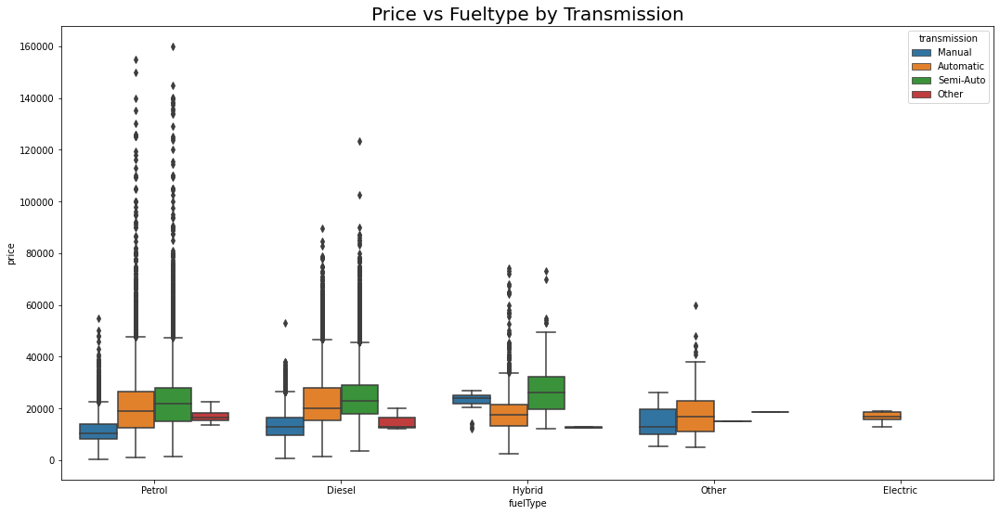

<Figure size 1152x432 with 0 Axes>

In [62]:
plt.figure(figsize=(18, 9))
sns.boxplot(x='fuelType', y='price', data=df, hue='transmission')
plt.title('Price vs Fueltype by Transmission', size = 20)
plt.figure(figsize=(16, 6))

1. Terlihat bahwa mobil dengan bahan bakar jenis petrol mempunyai outlier yang cukup banyak dan juga mempunyai harganya mempunyai potensi untuk menjulang lebih tinggi daripada bahan bakar lain. <br>
2. Untuk bahan bakar Petrol dan Diesel, transmisi manual memiliki kecenderungan untuk mempunyai harga yang lebih rendah daripada tipe transmisi lain.
3. Tipe bahan bakar electric dan hybrid memiliki rentang harga yang lebih kecil daripada tipe bahan bakar petrol dan diesel

# Modeling

In [63]:
from sklearn.compose import ColumnTransformer 
from sklearn.preprocessing import OneHotEncoder, OrdinalEncoder
from category_encoders import binary
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_squared_log_error, mean_squared_error, mean_absolute_error, r2_score, mean_absolute_percentage_error
from sklearn.model_selection import train_test_split, GridSearchCV, cross_validate, cross_val_score, RandomizedSearchCV

from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.tree import DecisionTreeRegressor 
from sklearn.linear_model import LinearRegression, Lasso, SGDRegressor, ElasticNet, BayesianRidge
from sklearn.svm import SVR
from sklearn.neural_network import MLPRegressor
from sklearn.neighbors import KNeighborsRegressor
import time

In [64]:
res = pd.DataFrame(columns=['Regressor', 'R-squared', 'r2 std','MAPE', 'mape std', 'MSE', 'mse std', 'time execution'])

In [65]:
## Pembagian train-test data

X = df.drop('price',axis=1)
y = df['price']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state=101)

bin_col = []
onehot_col = []

## Apablia jumlah data unik di atas 6, maka 
for i in X.select_dtypes(include='object').columns:
    if X[i].nunique() > 6:
        bin_col.append(i)
    else:
        onehot_col.append(i)

In [66]:
## Percobaan menggunakan 10 metode

Regressor = {
    'RandomForest': RandomForestRegressor(),
    'DecissionTree': DecisionTreeRegressor(),
    'Lasso': Lasso(),
    'Linreg': LinearRegression(),
    'MLP': MLPRegressor(),
    'KNN': KNeighborsRegressor(),
    'StochasticGradientDescent': SGDRegressor(),
    'ElasticNet': ElasticNet(),
    'Bayesian': BayesianRidge(),
    'GradientBoost': GradientBoostingRegressor()
}

for rgs in Regressor:
    start = time.time()

    ## Apply encoder
    encode = ColumnTransformer(
        transformers=[
            ('one hot encoder', OneHotEncoder(drop = 'first'), onehot_col),
            ('binary', binary.BinaryEncoder(), bin_col)
            ], remainder= 'passthrough')


    model = Pipeline(
        steps=[
            ('preprocessor', encode),
            ('model', Regressor[rgs])
        ]
    )
    scoring = ['r2','neg_mean_absolute_percentage_error','neg_mean_squared_error']
    ##Crossval
    c_score = cross_validate(model, X_train, y_train, cv=5,  scoring=scoring)
    time_exect = time.time()-start
    
    row = {
        'Regressor': rgs,
        'R-squared': np.mean(c_score['test_r2']),
        'r2 std': np.std(c_score['test_r2']),
        'MAPE': np.mean(c_score['test_neg_mean_absolute_percentage_error']) , 
        'mape std': np.std(c_score['test_neg_mean_absolute_percentage_error']) ,
        'MSE': np.mean(c_score['test_neg_mean_squared_error']) , 
        'mse std': np.std(c_score['test_neg_mean_squared_error']) ,
        'time execution': round(time_exect,2)
    }

    res = res.append(row, ignore_index=True)


In [111]:
res['MAPE'] = res['MAPE'].apply(lambda x: abs(x))
res.sort_values(['R-squared'], ascending=False)

,Regressor,R-squared,r2 std,MAPE,mape std,MSE,mse std,time execution
0,RandomForest,9.584701e-01,1.790374e-03,7.474427e-02,9.831779e-04,-4.050899e+06,2.187903e+05,138.07
1,DecissionTree,9.281654e-01,7.609998e-03,9.411063e-02,1.556311e-03,-7.005500e+06,7.633122e+05,3.21
9,GradientBoost,8.994515e-01,2.601809e-03,1.362577e-01,1.191927e-03,-9.801864e+06,2.499854e+05,53.90
4,MLP,8.336369e-01,4.975358e-03,1.936068e-01,4.454382e-03,-1.621750e+07,4.689917e+05,555.65
2,Lasso,7.782837e-01,6.020166e-03,2.355332e-01,7.647072e-03,-2.162305e+07,8.385534e+05,2.10
8,Bayesian,7.782670e-01,6.016284e-03,2.356367e-01,7.623458e-03,-2.162467e+07,8.383311e+05,1.37
3,Linreg,7.782369e-01,6.018087e-03,2.356516e-01,7.621180e-03,-2.162767e+07,8.400586e+05,1.27
7,ElasticNet,6.374304e-01,8.315552e-03,2.569590e-01,5.490987e-03,-3.537618e+07,1.662376e+06,1.65
5,KNN,4.363010e-01,9.074454e-03,3.743920e-01,3.040367e-03,-5.495670e+07,1.121309e+06,88.89
6,StochasticGradientDescent,-6.731339e+26,9.946630e+26,1.482727e+13,1.353070e+13,-6.701380e+34,9.952012e+34,8.84


Terlihat dari tabel di atas bahwa secara default RandomForest memiliki R square yang paling besar.
Dari hasil tersebut, kami memilih 3 metode yang terbaik yaitu RandomForest, DecisionTree, dan GradientBoost untuk dilakukan hyperparameter.

# Metode GradientBoost Regressor

## GradientBoost Gridsearch Hyperparameter Tuning

In [112]:
tuning_res = pd.DataFrame(columns=['Regressor', 'Tune', 'r2 score','MAPE', 'total duration','Best r2'])

In [113]:
start = time.time()

parameters = {
    "model__n_estimators":[100,150,200],
    "model__max_depth":[1,3,5]
}

encode = ColumnTransformer(
    transformers=[
        ('one hot encoder', OneHotEncoder(drop = 'first'), onehot_col),
        ('binary', binary.BinaryEncoder(), bin_col)
        ], remainder= 'passthrough')


model = Pipeline(
    steps=[
        ('preprocessor', encode),
        ('model', GradientBoostingRegressor())
    ]
)

gbr_gs=GridSearchCV(model, parameters_grid, scoring='r2', n_jobs=-1, cv=5, verbose=False)
gbr_gs.fit(X_train, y_train)

time_exect = time.time()-start

MAPE = mean_absolute_percentage_error(y_test, gbr_gs.predict(X_test))

In [115]:
row ={
    'Regressor': 'GradientBoost',
    'Tune': 'Gridsearch',
    'r2 score': gbr_gs.predict(X_test),
    'MAPE': MAPE,
    'total duration': time_exect,
    'time execution': np.mean(gbr_gs.cv_results_['mean_fit_time']),
    'Best r2': gbr_gs.best_score_
}

tuning_res = tuning_res.append(row, ignore_index=True)
print("Best R-squared {:.3f} params {}".format(gbr_gs.best_score_, gbr_gs.best_params_))

Best R-squared 0.899 params {'model__max_features': None, 'model__max_leaf_nodes': 90, 'model__min_weight_fraction_leaf': 0.0}


## GradientBoost Randomsearch Hyperparameter Tuning

In [117]:
start = time.time()

parameters = {
    "model__n_estimators":[100,150,200],
    "model__max_depth":[1,3,5]
}

encode = ColumnTransformer(
    transformers=[
        ('one hot encoder', OneHotEncoder(drop = 'first'), onehot_col),
        ('binary', binary.BinaryEncoder(), bin_col)
        ], remainder= 'passthrough')


model = Pipeline(
    steps=[
        ('preprocessor', encode),
        ('model', GradientBoostingRegressor())
    ]
)

gbr_rs=RandomizedSearchCV(model, parameters,n_iter=10, scoring='r2',n_jobs=-1, cv=5, verbose=False, random_state=101)
gbr_rs.fit(X_train, y_train)

time_exect = time.time()-start

MAPE = mean_absolute_percentage_error(y_test, gbr_rs.predict(X_test))

In [118]:
row ={
    'Regressor': 'GradientBoost',
    'Tune': 'RandomSearch',
    'r2 score': np.mean(gbr_rs.predict(X_test)),
    'MAPE': MAPE,
    'time duration': time_exect,
    'time execution': np.mean(gbr_rs.cv_results_['mean_fit_time']),
    'Best r2': gbr_rs.best_score_
}

tuning_res = tuning_res.append(row, ignore_index=True)
print("Best R-squared {:.3f} params {}".format(gbr_rs.best_score_, gbr_rs.best_params_))

Best R-squared 0.949 params {'model__n_estimators': 200, 'model__max_depth': 5}


# Decision Tree

## Decision Tree Gridsearch

In [119]:
start = time.time()

parameters_grid={"model__min_weight_fraction_leaf":np.linspace(0,.9,3),
                 "model__max_features":["auto",None],
                 "model__max_leaf_nodes":[None,10,30,50,70,90] }

encode = ColumnTransformer(
    transformers=[
        ('one hot encoder', OneHotEncoder(drop = 'first'), onehot_col),
        ('binary', binary.BinaryEncoder(), bin_col)
        ], remainder= 'passthrough')


model = Pipeline(
    steps=[
        ('preprocessor', encode),
        ('model', DecisionTreeRegressor())
    ]
)

dt_gs=GridSearchCV(model, parameters_grid, scoring='r2', n_jobs=-1, cv=5, verbose=False)
dt_gs.fit(X_train, y_train)

time_exect = time.time()-start

In [120]:
MAPE = mean_absolute_error(y_test, dt_gs.predict(X_test))

row ={
    'Regressor': 'DecisionTree',
    'Tune': 'GridSearch',
    'r2 score': np.mean(dt_gs.predict(X_test)),
    'MAPE': MAPE,
    'total duration': time_exect,
    'time execution': np.mean(dt_gs.cv_results_['mean_fit_time']),
    'Best r2': dt_gs.best_score_
}

tuning_res = tuning_res.append(row, ignore_index=True)
print("Best R-squared {:.3f} params {}".format(dt_gs.best_score_, dt_gs.best_params_))

Best R-squared 0.929 params {'model__max_features': 'auto', 'model__max_leaf_nodes': None, 'model__min_weight_fraction_leaf': 0.0}


## Decision Tree Randomsearch

In [121]:
start = time.time()

parameters={"model__min_weight_fraction_leaf":np.linspace(0,.9,3),
            "model__max_features":["auto",None],
            "model__max_leaf_nodes":[None,10,30,50,70,90]}

encode = ColumnTransformer(
    transformers=[
        ('one hot encoder', OneHotEncoder(drop = 'first'), onehot_col),
        ('binary', binary.BinaryEncoder(), bin_col)
        ], remainder= 'passthrough')


model = Pipeline(
    steps=[
        ('preprocessor', encode),
        ('model', DecisionTreeRegressor())
    ]
)

dt_rs=RandomizedSearchCV(model, parameters, n_iter = 20, scoring='r2',n_jobs=-1, cv=5, verbose=False, random_state=101)
dt_rs.fit(X_train, y_train)

time_exect = time.time()-start

In [123]:
MAPE = mean_absolute_percentage_error(y_test, dt_rs.predict(X_test))

row ={
    'Regressor': 'DecisionTree',
    'Tune': 'RandomSearch',
    'r2 score': dt_rs.predict(X_test),
    'MAPE': MAPE,
    'time duration': time_exect,
    'time execution': np.mean(dt_rs.cv_results_['mean_fit_time']),
    'Best r2': dt_rs.best_score_
}

tuning_res = tuning_res.append(row, ignore_index=True)
print("Best R-squared {:.3f} params {}".format(dt_rs.best_score_, dt_rs.best_params_))

Best R-squared 0.927 params {'model__min_weight_fraction_leaf': 0.0, 'model__max_leaf_nodes': None, 'model__max_features': None}


# Random Forest

## Random Forest Gridsearch

In [125]:
start = time.time()
rf_param_grid = {'model__max_features': ['auto', 'sqrt'],
                 'model__n_estimators': np.linspace(10,100,5, dtype = int)}

encode = ColumnTransformer(
    transformers=[
        ('one hot encoder', OneHotEncoder(drop = 'first'), onehot_col),
        ('binary', binary.BinaryEncoder(), bin_col)
        ], remainder= 'passthrough')


model = Pipeline(
    steps=[
        ('preprocessor', encode),
        ('model', RandomForestRegressor())
    ]
)

rf_gs=GridSearchCV(model, rf_param_grid, scoring='r2', n_jobs=-1, cv=5, verbose=False)
rf_gs.fit(X_train, y_train)

time_exect = time.time()-start

In [126]:
MAPE = mean_absolute_percentage_error(y_test, rf_gs.predict(X_test))

row ={
    'Regressor': 'RandomForest',
    'Tune': 'GridSearch',
    'r2 score': np.mean(rf_gs.predict(X_test)),
    'MAPE': MAPE,
    'time duration': time_exect,
    'time execution': np.mean(rf_gs.cv_results_['mean_fit_time']),
    'Best r2': rf_gs.best_score_
}

tuning_res = tuning_res.append(row, ignore_index=True)
print("Best R-squared {:.3f} params {}".format(rf_gs.best_score_, rf_gs.best_params_))

Best R-squared 0.960 params {'model__max_features': 'sqrt', 'model__n_estimators': 100}


## Random Forest randomsearch

In [130]:
start = time.time()
rf_param_rand = {'model__max_features': ['auto', 'sqrt'],
                 'model__n_estimators': randint(10, 200)}

encode = ColumnTransformer(
    transformers=[
        ('one hot encoder', OneHotEncoder(drop = 'first'), onehot_col),
        ('binary', binary.BinaryEncoder(), bin_col)
        ], remainder= 'passthrough')


model = Pipeline(
    steps=[
        ('preprocessor', encode),
        ('model', RandomForestRegressor())
    ]
)

rf_rs=RandomizedSearchCV(model, rf_param_rand, n_iter = 15, scoring='r2',n_jobs=-1, cv=5, verbose=False, random_state=101)
rf_rs.fit(X_train, y_train)

time_exect = time.time()-start

In [131]:
MAPE = mean_absolute_percentage_error(y_test, rf_rs.predict(X_test))

row ={
    'Regressor': 'RandomForest',
    'Tune': 'RandomSearch',
    'r2 score': np.mean(rf_rs.predict(X_test)),
    'MAPE': MAPE,
    'time duration': time_exect,
    'time execution': np.mean(rf_rs.cv_results_['mean_fit_time']),
    'Best r2': rf_rs.best_score_
}

tuning_res = tuning_res.append(row, ignore_index=True)
print("Best R-squared {:.3f} params {}".format(rf_rs.best_score_, rf_rs.best_params_))

Best R-squared 0.961 params {'model__max_features': 'sqrt', 'model__n_estimators': 198}


In [143]:
tuning_res = tuning_res[["Regressor", "Tune", "Best r2", "time execution"]].sort_values("Best r2", ascending = False)
tuning_res

,Regressor,Tune,Best r2,time execution
5,RandomForest,RandomSearch,0.960922,46.643236
4,RandomForest,GridSearch,0.960358,25.380403
1,GradientBoost,RandomSearch,0.949097,49.623444
2,DecisionTree,GridSearch,0.929391,0.798746
3,DecisionTree,RandomSearch,0.927175,0.936790
0,GradientBoost,Gridsearch,0.899472,17.132765


Dari hasil hyperparameter tuning, maka diplih model RandomForest dengan Tune menggunakan RandomSearch dengan Tuning RandomSearch.

# Pengaplikasian Model di simulasi real world

In [218]:
# membagi data real world simulation menjadi data validasi dan data test
test_set = pd.merge(X_test,y_test,left_index=True, right_index=True)
X_sim = test_set.drop('price',axis=1)
y_sim = test_set['price']

X_val, X_simu, y_val, y_simu = train_test_split(X_sim, y_sim, test_size = 0.2, random_state=101)

In [228]:
## Mendapatkan kebaikkan model yang telah dibuat
y_pred_val = rf_gs.predict(X_val)
r2 = r2_score(y_val, y_pred_val)
r2

0.9588410872450261

Nilai R Squared digunakan untuk mengukur kebaikkan model. Dari model yang dihasilkan, didapatkan R Squared sebesar 95%

In [229]:
#menghitung mean absolute error dari data validasi untuk dijadikan prediction interval
mae = mean_absolute_error(y_val, y_pred_val)

In [220]:
#membuat dataframe berisi price, prediction_price, lower_bound, upper_bound
# Running Model on Data

list_mobil = pd.merge(X_simu,y_simu,left_index=True, right_index=True)
list_mobil['prediction_price'] = rf_gs.predict(X_simu)
list_mobil['lower bound'] = list_mobil['prediction_price'] - mae
list_mobil['upper bound'] = list_mobil['prediction_price'] + mae

toBuy = list_mobil[list_mobil['price']<list_mobil['lower bound']].copy()
toBuy['low_profit'] = toBuy['lower bound']-toBuy['price']
toBuy['high_profit'] = toBuy['upper bound']-toBuy['price']

Berikut adalah daftar mobil yang dapat dibeli beserta batas atas dan batas bawah dari harga jual berikut bersama potensi keuntungan tiap unit terjual :

In [221]:
toBuy

,model,year,transmission,mileage,fuelType,tax,mpg,engineSize,brand,price,prediction_price,lower bound,upper bound,low_profit,high_profit
48606,CLS Class,2018,Semi-Auto,11700,Diesel,145.0,51.4,3.0,Merc,26682,31429.750000,30293.724548,32565.775452,3611.724548,5883.775452
13118,3 Series,2019,Semi-Auto,9898,Diesel,145.0,49.6,3.0,BMW,28497,31010.310000,29874.284548,32146.335452,1377.284548,3649.335452
20240,4 Series,2019,Automatic,8509,Diesel,145.0,65.7,2.0,BMW,23500,27217.170000,26081.144548,28353.195452,2581.144548,4853.195452
24891,Kuga,2019,Manual,9386,Diesel,145.0,47.9,2.0,Ford,19500,20728.660000,19592.634548,21864.685452,92.634548,2364.685452
3546,A1,2019,Manual,11120,Petrol,145.0,51.4,1.0,Audi,15600,17464.710000,16328.684548,18600.735452,728.684548,3000.735452
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11269,2 Series,2019,Manual,3935,Petrol,150.0,40.9,1.5,BMW,16998,20308.910000,19172.884548,21444.935452,2174.884548,4446.935452
38471,Kuga,2019,Manual,9396,Diesel,145.0,47.9,2.0,Ford,19500,20751.370000,19615.344548,21887.395452,115.344548,2387.395452
96610,Caddy Maxi Life,2020,Semi-Auto,2134,Diesel,150.0,46.3,2.0,VW,21995,23310.716667,22174.691215,24446.742119,179.691215,2451.742119
44937,GLE Class,2017,Automatic,25906,Diesel,145.0,42.8,3.0,Merc,27790,31246.620000,30110.594548,32382.645452,2320.594548,4592.645452


Berdasarkan data tersebut, maka dapat dihitung potensi total keuntungan maksimal dan keuntungan minimal perusahaan :

In [226]:
max_profit = np.sum(toBuy['high_profit'])
min_profit = np.sum(toBuy['low_profit'])
modal = np.sum(toBuy['price'])


print(f"Berikut adalah minimum profit yang akan diperoleh : {round(min_profit/modal*100)}%")
print(f"Berikut adalah maximum profit yang akan diperoleh : {round(max_profit/modal*100)}%")

Berikut adalah minimum profit yang akan diperoleh : 6%
Berikut adalah maximum profit yang akan diperoleh : 18%


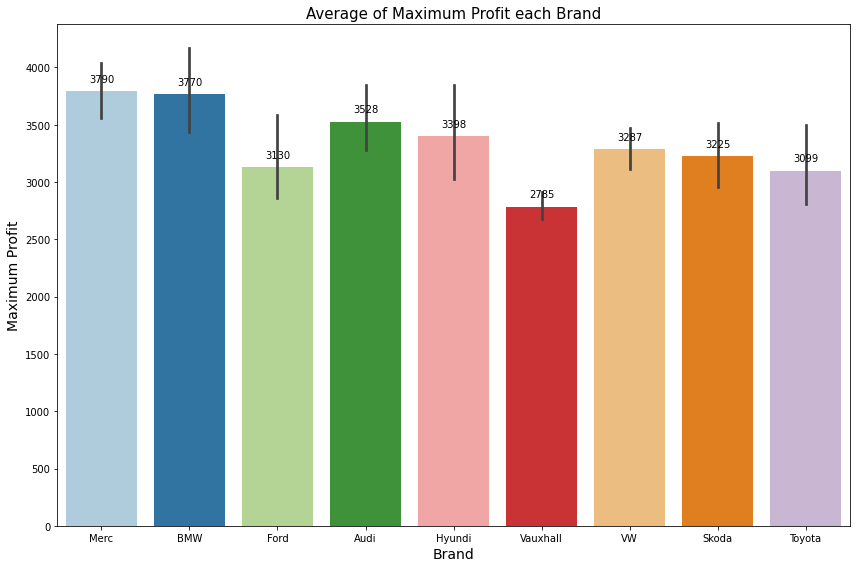

In [223]:
fig = plt.figure(figsize=(12,8))
splot = sns.barplot(x='brand', y='high_profit',data=toBuy, 
                        palette='Paired')
for p in splot.patches:
    splot.annotate(format(p.get_height(), '.0f'), 
                   (p.get_x() + p.get_width() / 2., p.get_height()), 
                   ha = 'center', va = 'center', 
                   size=10,
                   xytext = (0, 12), 
                   textcoords = 'offset points')
plt.xlabel("Brand", size=14)
plt.ylabel("Maximum Profit", size=14)
plt.title('Average of Maximum Profit each Brand', size=15)
plt.tight_layout()
plt.show()

Brand BMW dan Merc direkomendasikan untuk menjadi prioritas pembelian karena lebih berpotensi mendapatkan profit yang lebih besar daripada brand lainnya.

## VI. Kesimpulan

      1. Data merupakan penjualan mobil pada sebuah platform.
      2. Proses cleaning yang dilakukan menghasilkan data sebanyak 98385
      3. Dilakukan untuk mengetahui pola dari data mobil yang dijual
      4. Untuk menghasilkan prediksi yang baik dilakukan seleksi model menggunakan R-squared sebagai acuan.
      5. Model terbaik menghasilkan R-squared sebesar 96% 


## VII. Business Impact

Hasil pembelian mobil diharapkan dapat dijual kembali sesuai dengan harga pasar yang telah dimodelkan dari analisis yang telah dilakukan. Dari hasil jual kembali mobil maka perusahaan diharapkan dapat meningkatkan keuntungan dari yang hanya berkisar 5% menjadi 6% hingga 18%.